# Hyperparameter Tuning :
is the process of optimizing the parameters of a model to improve its performance. This can involve techniques such as grid search, random search, or Bayesian optimization to find the best combination of hyperparameters for a given dataset and model.
used to improve the performance of machine learning models by finding the best set of hyperparameters.
### Hyperparameter :
A hyperparameter is a parameter whose value is set before the learning process begins. These parameters control the learning process and can significantly impact the performance of the model. Examples of hyperparameters include the learning rate, the number of hidden layers in a neural network, and the regularization strength in linear models.
## Hyperparameter Tuning Techniques
1. Grid Search: This method involves specifying a list of values for different hyperparameters and training the model for every combination of these values. It is exhaustive but can be computationally expensive.
2. Random Search: Instead of trying every combination, random search samples a fixed number of hyperparameter combinations from the specified distributions. This can be more efficient than grid search.
3. Bayesian Optimization: This is a probabilistic model-based optimization technique that builds a surrogate model to predict the performance of different hyperparameter combinations and uses this model to select the most promising combinations to evaluate.

In [175]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from mlxtend.plotting import plot_decision_regions
import matplotlib.pyplot as plt

In [176]:
dataset = pd.read_csv("/Users/adityagoyal/Downloads/Dataset/Position_Salaries.csv")
dataset.head()

,Position,Level,Salary
0,Business Analyst,1,45000
1,Junior Consultant,2,50000
2,Senior Consultant,3,60000
3,Manager,4,80000
4,Country Manager,5,110000


In [177]:
dataset.drop(columns=["Position"], inplace=True)

In [178]:
x = dataset.iloc[:, :-1].values
y = dataset.iloc[:, -1].values

In [179]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [180]:
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor(criterion='squared_error',
 max_depth=5,
 splitter='best',
 random_state=42)
regressor.fit(x_train, y_train)

,criterion,'squared_error'
,splitter,'best'
,max_depth,5
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,42
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,ccp_alpha,0.0


In [181]:
regressor.score(x_test, y_test)*100 , regressor.score(x_train, y_train)*100

(60.46913580246913, 100.0)

In [182]:
from sklearn.model_selection import GridSearchCV , RandomizedSearchCV

In [183]:
regressor = {"criterion": ["squared_error", "friedman_mse", "absolute_error", "poisson"],
             "splitter": ["best", "random"],
             "max_depth": [i for i in range(1, 21)],
             "random_state": [i for i in range(1,100)]
            }

In [184]:
gd = GridSearchCV(DecisionTreeRegressor(), param_grid=regressor)
gd.fit(x_train, y_train)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Pyth

,estimator,DecisionTreeRegressor()
,param_grid,"{'criterion': ['squared_error', 'friedman_mse', ...], 'max_depth': [1, 2, ...], 'random_state': [1, 2, ...], 'splitter': ['best', 'random']}"
,scoring,None
,n_jobs,None
,refit,True
,cv,None
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,criterion,'squared_error'


In [185]:
gd.cv_results_

{'mean_fit_time': array([0.00046716, 0.00017247, 0.00024638, ..., 0.00019054, 0.00018697,
        0.00018597], shape=(15840,)),
 'std_fit_time': array([4.10911847e-04, 1.24001501e-05, 9.86636576e-05, ...,
        7.66863270e-06, 4.51965165e-06, 3.71198663e-06], shape=(15840,)),
 'mean_score_time': array([0.00019574, 0.00012097, 0.00017996, ..., 0.00012074, 0.00011826,
        0.0001194 ], shape=(15840,)),
 'std_score_time': array([6.49729780e-05, 1.71327266e-05, 1.26246039e-04, ...,
        7.78516069e-06, 1.03496734e-05, 8.07728930e-06], shape=(15840,)),
 'param_criterion': masked_array(data=['squared_error', 'squared_error', 'squared_error', ...,
                    'poisson', 'poisson', 'poisson'],
              mask=[False, False, False, ..., False, False, False],
        fill_value=np.str_('?'),
             dtype=object),
 'param_max_depth': masked_array(data=[1, 1, 1, ..., 20, 20, 20],
              mask=[False, False, False, ..., False, False, False],
        fill_value=999999)

In [186]:
gd.best_params_

{'criterion': 'squared_error',
 'max_depth': 1,
 'random_state': 1,
 'splitter': 'best'}

in my case gridsearch not give me a good parameter because the dataset is small and the model is overfitting. I will use the parameters found by gridsearch and then manually tune them.

#### Cross Validation :
is a technique used to assess the performance of a model by training it on different subsets of the data and evaluating it on the remaining portions. This helps in understanding how well the model generalizes to unseen data and is particularly useful in scenarios with limited data.
##### Working :
1. The dataset is divided into 'k' subsets or folds.
2. The model is trained on 'k-1' folds and tested on the remaining fold.
3. This process is repeated 'k' times, with each fold being used as the test set once.
4. The performance metrics are averaged over all 'k' iterations to obtain a more reliable estimate of the model's performance.
### Benefits of Cross Validation :
- Provides a more accurate measure of model performance compared to a single train/test split.
- Helps in identifying issues like overfitting and underfitting.
- Can be used for hyperparameter tuning by evaluating different model configurations.
### Limitations of Cross Validation :
- Can be computationally expensive, especially with large datasets and complex models.
- May not be suitable for time series data, where the order of observations is important.
### Methods :
1. **K-Fold Cross Validation**: The dataset is divided into 'k' folds, and the model is trained and tested 'k' times, with each fold being used as the test set once.
2. **Stratified K-Fold Cross Validation**: Similar to K-Fold, but ensures that each fold has a representative distribution of the target variable, which is particularly useful for imbalanced datasets.
3. **Leave-One-Out Cross Validation (LOOCV)**: A special case of K-Fold where 'k' is equal to the number of data points. Each iteration uses a single data point as the test set and the rest as the training set.
4. **Group K-Fold Cross Validation**: Used when there are groups in the data that should not be split across training and test sets. This is useful for scenarios like time series or when dealing with related samples.
5. **Repeated K-Fold Cross Validation**: Involves repeating the K-Fold cross-validation process multiple times with different randomization in the data splitting. This helps in obtaining a more robust estimate of model performance.
6. **Time Series Cross Validation**: Specifically designed for time series data, this method respects the temporal order of observations. It involves training the model on past data and testing it on future data, often using techniques like rolling windows or expanding windows.
7. **Nested Cross Validation**: This method involves two layers of cross-validation. The inner loop is used for hyperparameter tuning, while the outer loop is used for estimating the model's performance. This approach helps in obtaining a more reliable estimate of model performance with tuned hyperparameters.
8. **Bootstrap Cross Validation**: This method involves creating multiple bootstrap samples from the training data and evaluating the model on each sample. It helps in assessing the model's performance and variability by training on different subsets of the data.
9. **Custom Cross Validation**: This method allows for the creation of user-defined cross-validation strategies tailored to specific datasets or modeling requirements. It provides flexibility in how the data is split and evaluated, accommodating unique challenges in the data.
10. **Adaptive Cross Validation**: This method adjusts the cross-validation strategy based on the model's performance during training. It can involve changing the number of folds, the size of the training set, or other parameters to improve model evaluation.

In [187]:
#. **K-Fold Cross Validation**: 
dataset = pd.read_csv(r"/Users/adityagoyal/Downloads/Dataset/cgpa.csv")
dataset.head()

,cgpa,package
0,6.89,3.26
1,5.12,1.98
2,7.82,3.25
3,7.42,3.67
4,6.94,3.57


In [188]:
x = dataset.iloc[:, :-1].values
y = dataset.iloc[:, -1].values

In [189]:
new_data = dataset.head(10)

In [190]:
xn = new_data.iloc[:, :-1].values
yn = new_data.iloc[:, -1].values

In [191]:
from sklearn.model_selection import LeaveOneOut, LeavePOut, KFold, StratifiedKFold
loo = LeaveOneOut()
lpo = LeavePOut(p=2)
kf = KFold(n_splits=5, shuffle=True, random_state=42)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [192]:
for train , test in loo.split(xn,yn):
    print("Train:", train, "Test:", test)

for train, test in lpo.split(xn, yn):
    print("Train:", train, "Test:", test)

for train, test in kf.split(xn, yn ):
    print("Train:", train, "Test:", test)



Train: [1 2 3 4 5 6 7 8 9] Test: [0]
Train: [0 2 3 4 5 6 7 8 9] Test: [1]
Train: [0 1 3 4 5 6 7 8 9] Test: [2]
Train: [0 1 2 4 5 6 7 8 9] Test: [3]
Train: [0 1 2 3 5 6 7 8 9] Test: [4]
Train: [0 1 2 3 4 6 7 8 9] Test: [5]
Train: [0 1 2 3 4 5 7 8 9] Test: [6]
Train: [0 1 2 3 4 5 6 8 9] Test: [7]
Train: [0 1 2 3 4 5 6 7 9] Test: [8]
Train: [0 1 2 3 4 5 6 7 8] Test: [9]
Train: [2 3 4 5 6 7 8 9] Test: [0 1]
Train: [1 3 4 5 6 7 8 9] Test: [0 2]
Train: [1 2 4 5 6 7 8 9] Test: [0 3]
Train: [1 2 3 5 6 7 8 9] Test: [0 4]
Train: [1 2 3 4 6 7 8 9] Test: [0 5]
Train: [1 2 3 4 5 7 8 9] Test: [0 6]
Train: [1 2 3 4 5 6 8 9] Test: [0 7]
Train: [1 2 3 4 5 6 7 9] Test: [0 8]
Train: [1 2 3 4 5 6 7 8] Test: [0 9]
Train: [0 3 4 5 6 7 8 9] Test: [1 2]
Train: [0 2 4 5 6 7 8 9] Test: [1 3]
Train: [0 2 3 5 6 7 8 9] Test: [1 4]
Train: [0 2 3 4 6 7 8 9] Test: [1 5]
Train: [0 2 3 4 5 7 8 9] Test: [1 6]
Train: [0 2 3 4 5 6 8 9] Test: [1 7]
Train: [0 2 3 4 5 6 7 9] Test: [1 8]
Train: [0 2 3 4 5 6 7 8] Test: [1 9]
T

In [193]:
for train, test in kf.split(xn, yn):
    print("Train:", train, "Test:", test)

Train: [0 2 3 4 5 6 7 9] Test: [1 8]
Train: [1 2 3 4 6 7 8 9] Test: [0 5]
Train: [0 1 3 4 5 6 8 9] Test: [2 7]
Train: [0 1 2 3 5 6 7 8] Test: [4 9]
Train: [0 1 2 4 5 7 8 9] Test: [3 6]


In [194]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()

In [195]:
from sklearn.model_selection import cross_val_score

In [196]:
p = cross_val_score(model, x, y, cv=kf, scoring='r2')

In [197]:
p.sort()
p*100

array([67.38797214, 69.85493251, 77.30984312, 81.18312617, 83.39351744])

# Unsupervised Learning :
is a type of machine learning that deals with unlabeled data. The goal is to find hidden patterns or intrinsic structures in the input data. Unlike supervised learning, where the model is trained on labeled data, unsupervised learning algorithms must discover the underlying structure without any guidance.

Common techniques in unsupervised learning include clustering, dimensionality reduction, and anomaly detection. Clustering algorithms, such as K-means and hierarchical clustering, group similar data points together. Dimensionality reduction techniques, like PCA (Principal Component Analysis) and t-SNE (t-Distributed Stochastic Neighbor Embedding), aim to reduce the number of features while preserving the essential structure of the data. Anomaly detection methods identify rare or unusual data points that deviate significantly from the norm.

Unsupervised learning has various applications, including customer segmentation, image compression, and anomaly detection in network security.

### Clustering :
is an unsupervised learning technique used to group similar data points together based on their features. The goal of clustering is to identify inherent patterns or structures within the data without prior knowledge of the group labels.

Common clustering algorithms include K-means, hierarchical clustering, and DBSCAN. Clustering has various applications, such as customer segmentation, image compression, and anomaly detection.

#### Limitations of Clustering :
1. Sensitivity to Initialization: Some clustering algorithms, like K-means, are sensitive to the initial placement of centroids, which can lead to different results on different runs.
2. Determining the Number of Clusters: Many clustering algorithms require the number of clusters to be specified in advance, which may not be known a priori.
3. Scalability: Clustering large datasets can be computationally expensive and may require optimization techniques.
4. Interpretability: The results of clustering may be difficult to interpret, especially in high-dimensional spaces.
#### Conclusion
Clustering is a powerful technique for exploratory data analysis and pattern recognition. Despite its limitations, it provides valuable insights into the structure of the data and can be a useful tool in various applications.

### 1. K-means Clustering :
is a popular clustering algorithm that partitions the data into K distinct clusters based on feature similarity. The algorithm works by initializing K centroids, assigning data points to the nearest centroid, and then updating the centroids based on the assigned points. This process is repeated until convergence.

K-means is widely used for tasks such as customer segmentation, image compression, and pattern recognition.

Limitations of K-means:
1. Sensitivity to Initialization: K-means is sensitive to the initial placement of centroids, which can lead to different results on different runs.
2. Determining the Number of Clusters: The user must specify the number of clusters (K) in advance, which may not be known a priori.
3. Scalability: K-means can be computationally expensive for large datasets, as it requires multiple passes over the data.
4. Assumption of Spherical Clusters: K-means assumes that clusters are spherical and equally sized, which may not be the case in real-world data.

#### Elbow Method :
The elbow method is a technique used to determine the optimal number of clusters (K) in K-means clustering. It involves running the K-means algorithm for a range of K values and plotting the within-cluster sum of squares (WCSS) against the number of clusters. The point at which the WCSS begins to level off (forming an "elbow") indicates the optimal K value.

Limitations of the Elbow Method:
1. Subjectivity: The determination of the "elbow" point can be subjective and may vary between different observers.
2. Non-Convex Clusters: The elbow method may not perform well for non-convex clusters or clusters of varying densities.
3. Computational Cost: Running K-means for multiple values of K can be computationally expensive, especially for large datasets.


In [198]:
dataset = pd.read_csv(r"/Users/adityagoyal/Downloads/Dataset/IRIS.csv")
dataset.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa


In [199]:
dataset.drop(columns = "species", inplace = True)

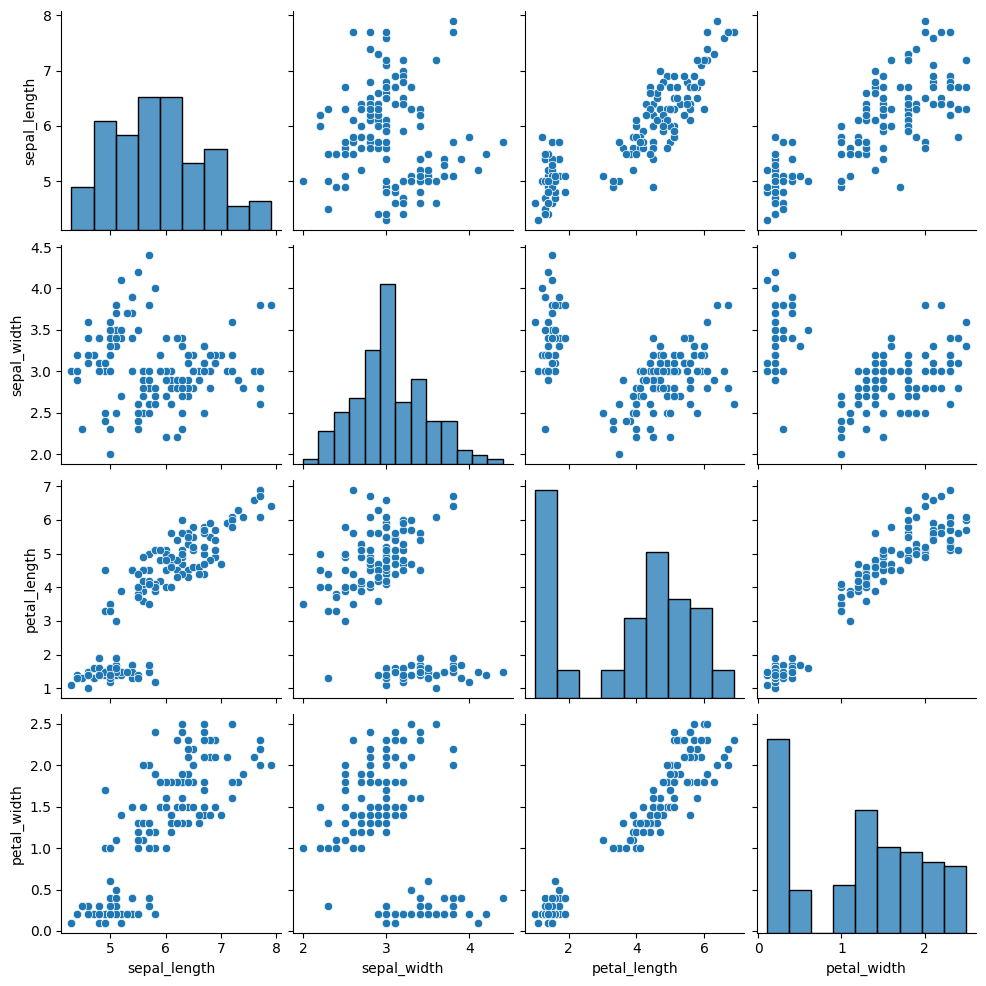

In [200]:
sns.pairplot(dataset)

In [201]:
from sklearn.cluster import KMeans

#### Wcss :
The within-cluster sum of squares (WCSS) is a measure of the variability of the data points within each cluster. It quantifies how tightly the data points are clustered around the centroid. A lower WCSS value indicates that the data points are closer to the centroid, resulting in a more compact and well-defined cluster.


In [202]:
wcss = []
for i in range(1, 21):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(dataset)
    wcss.append(kmeans.inertia_)


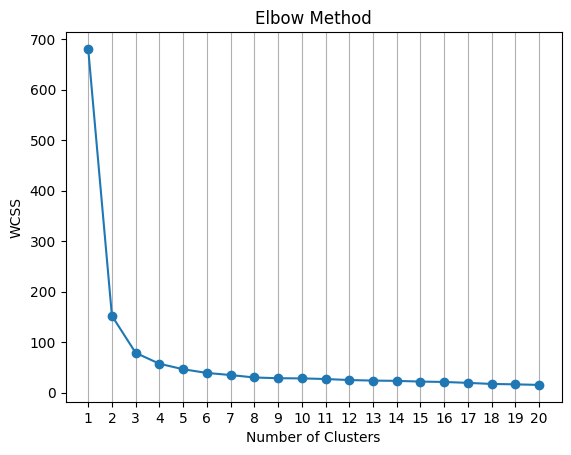

In [203]:
plt.plot([i for i in range(1, 21)], wcss, marker='o')
plt.title("Elbow Method")
plt.xlabel("Number of Clusters")
plt.xticks([i for i in range(1, 21)])
plt.ylabel("WCSS")
plt.grid(axis = 'x')
plt.show()

In [204]:
kmeans = KMeans(n_clusters=3, random_state=42)
dataset["predicted"] = kmeans.fit_predict(dataset)

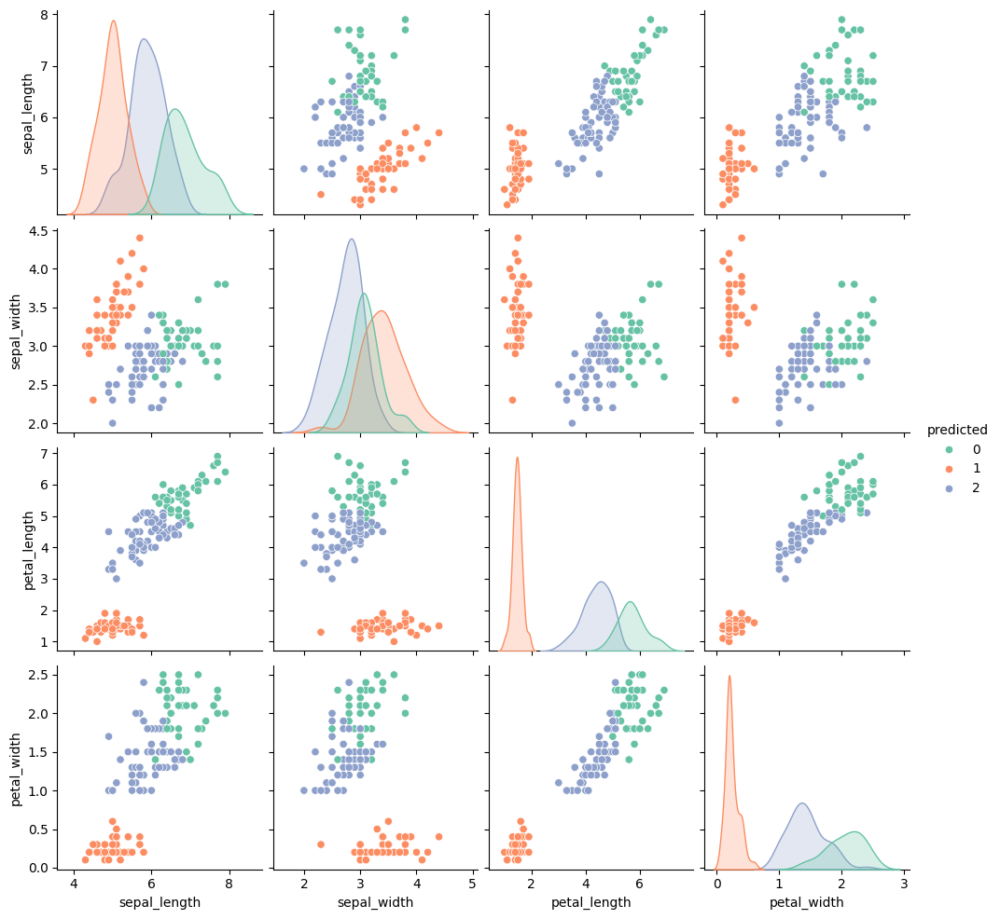

In [205]:
sns.pairplot(dataset, hue="predicted", palette="Set2")
plt.show()

In [206]:
data = pd.read_csv(r"/Users/adityagoyal/Downloads/Dataset/IRIS.csv")
data.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa


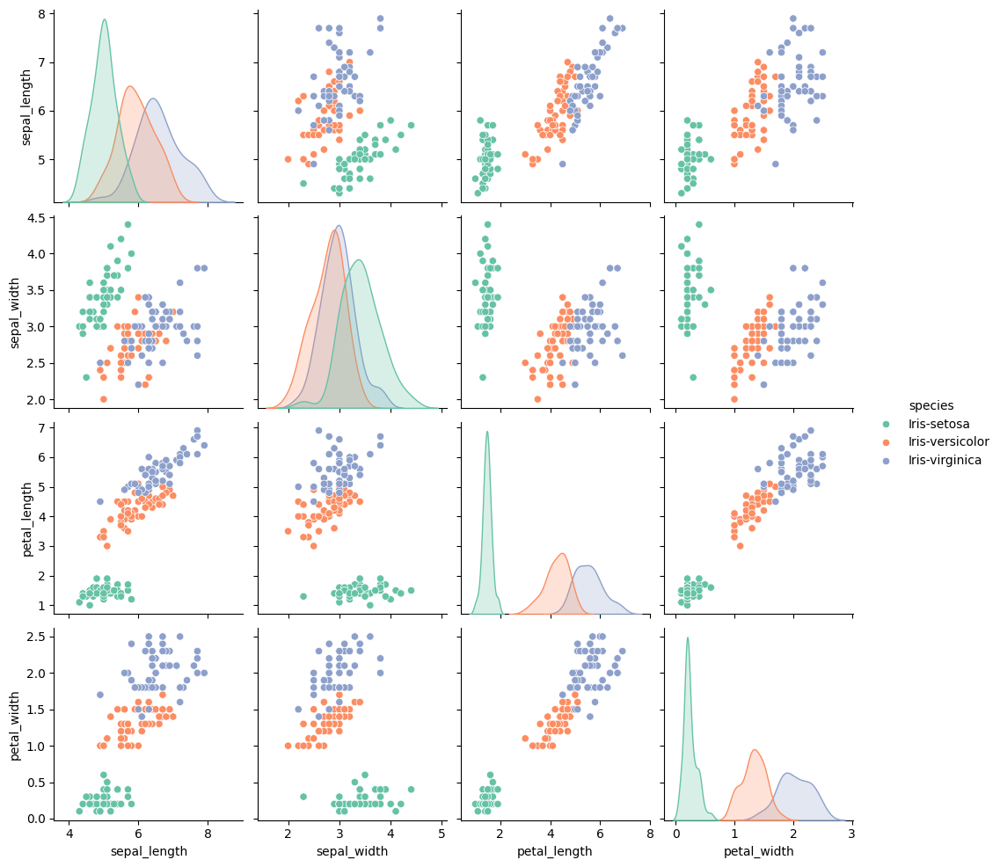

In [207]:
sns.pairplot(data, hue="species", palette="Set2")

### 2. Hierarchical Clustering :
is performed using the `AgglomerativeClustering` class from the `sklearn.cluster` module. This method groups data points into clusters based on their similarity, creating a hierarchy of clusters.
#### Agglomerative Clustering :
a bottom-up approach that starts with each data point as an individual cluster and merges them into larger clusters based on their similarity.

#### Divisive Clustering :
is a top-down approach that starts with all data points in a single cluster and recursively splits them into smaller clusters.

##### Linkage Criteria :
defines how the distance between clusters is calculated. Common linkage criteria include single, complete, and average linkage.
1. single linkage considers the minimum distance between points in different clusters.
2. complete linkage considers the maximum distance between points in different clusters.
3. average linkage considers the average distance between points in different clusters.
4. centroid linkage considers the distance between the centroids of the clusters.
##### dendrogram :
is used to visualize the arrangement of the clusters formed by the hierarchical clustering algorithm.

In [208]:
data = pd.read_csv(r"/Users/adityagoyal/Downloads/Dataset/IRIS.csv")
data.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa


In [210]:
data.drop(columns=["species"], inplace=True)

In [211]:
import scipy.cluster.hierarchy as sch

{'icoord': [[25.0, 25.0, 35.0, 35.0],
  [15.0, 15.0, 30.0, 30.0],
  [65.0, 65.0, 75.0, 75.0],
  [55.0, 55.0, 70.0, 70.0],
  [45.0, 45.0, 62.5, 62.5],
  [22.5, 22.5, 53.75, 53.75],
  [5.0, 5.0, 38.125, 38.125],
  [105.0, 105.0, 115.0, 115.0],
  [95.0, 95.0, 110.0, 110.0],
  [85.0, 85.0, 102.5, 102.5],
  [145.0, 145.0, 155.0, 155.0],
  [135.0, 135.0, 150.0, 150.0],
  [125.0, 125.0, 142.5, 142.5],
  [93.75, 93.75, 133.75, 133.75],
  [21.5625, 21.5625, 113.75, 113.75],
  [205.0, 205.0, 215.0, 215.0],
  [195.0, 195.0, 210.0, 210.0],
  [185.0, 185.0, 202.5, 202.5],
  [175.0, 175.0, 193.75, 193.75],
  [165.0, 165.0, 184.375, 184.375],
  [67.65625, 67.65625, 174.6875, 174.6875],
  [225.0, 225.0, 235.0, 235.0],
  [245.0, 245.0, 255.0, 255.0],
  [230.0, 230.0, 250.0, 250.0],
  [275.0, 275.0, 285.0, 285.0],
  [265.0, 265.0, 280.0, 280.0],
  [315.0, 315.0, 325.0, 325.0],
  [305.0, 305.0, 320.0, 320.0],
  [295.0, 295.0, 312.5, 312.5],
  [335.0, 335.0, 345.0, 345.0],
  [365.0, 365.0, 375.0, 375.0],


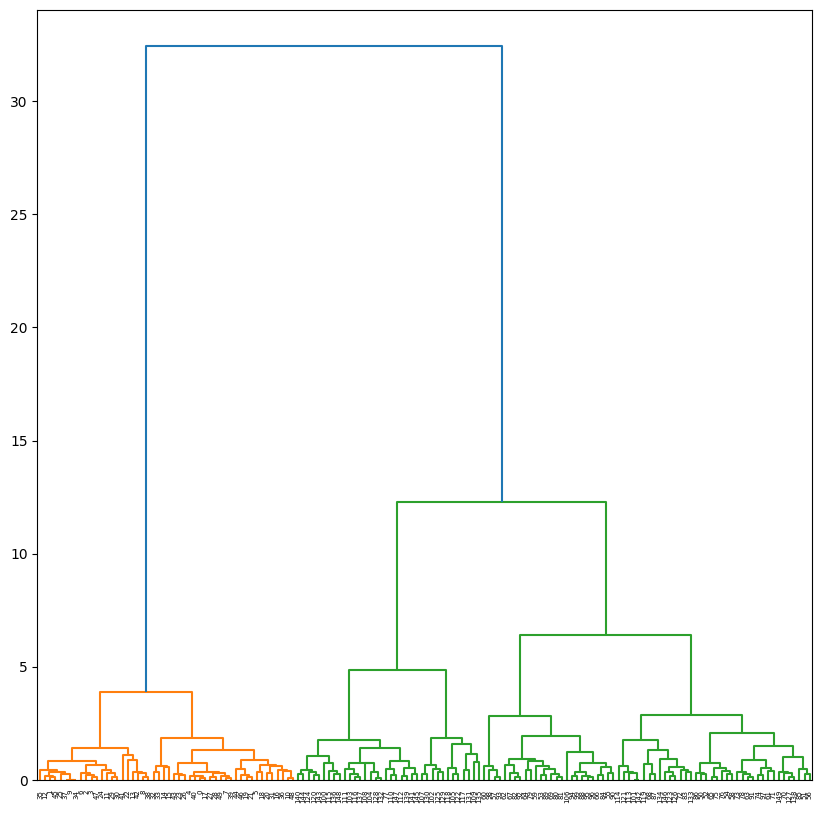

In [215]:
plt.figure(figsize=(10, 10))
sch.dendrogram(sch.linkage(data, method='ward', metric='euclidean'))

In [218]:
from sklearn.cluster import AgglomerativeClustering

In [225]:
ac = AgglomerativeClustering(n_clusters=2, linkage='single')
data['cluster'] = ac.fit_predict(data)

In [223]:
data.head()

,sepal_length,sepal_width,petal_length,petal_width,cluster
0,5.1,3.5,1.4,0.2,1
1,4.9,3.0,1.4,0.2,1
2,4.7,3.2,1.3,0.2,1
3,4.6,3.1,1.5,0.2,1
4,5.0,3.6,1.4,0.2,1


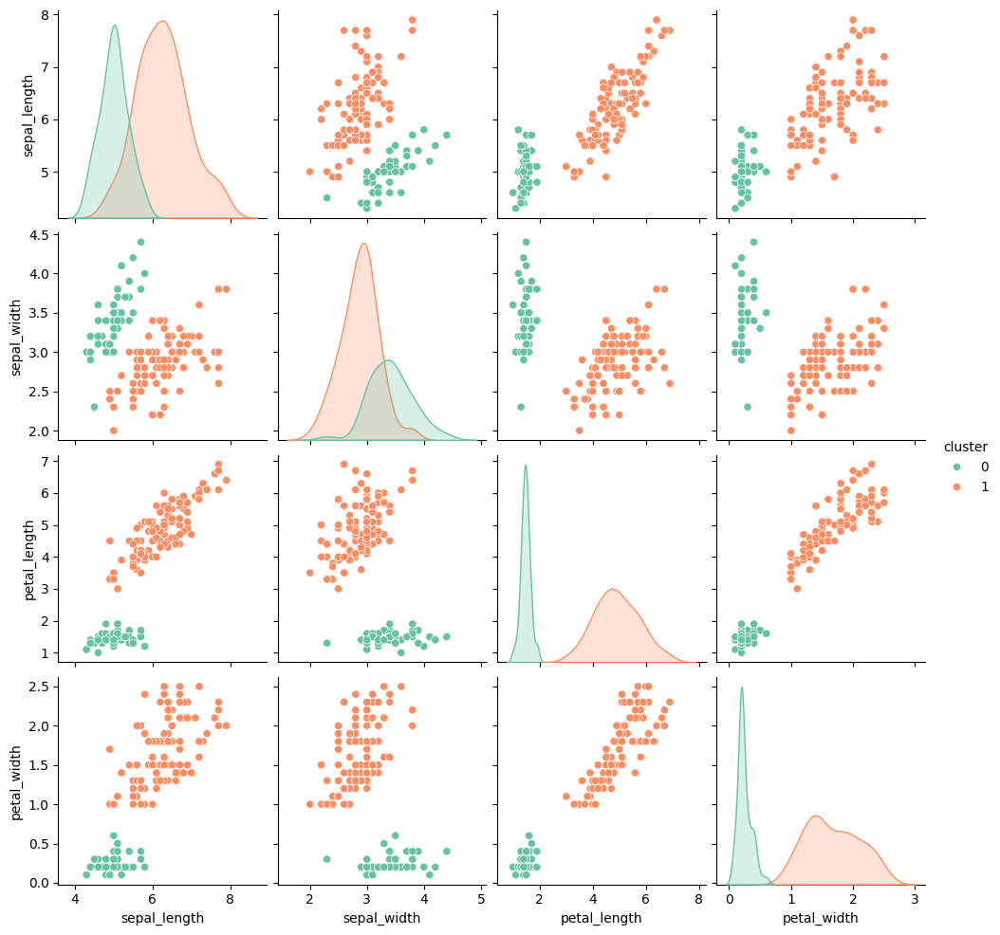

In [226]:
sns.pairplot(data, hue="cluster", palette="Set2")

# DBSCAN Clustering :
is a density-based clustering algorithm that can find arbitrarily shaped clusters and is robust to noise. It works by grouping together points that are closely packed together while marking points that lie alone in low-density regions as outliers.

## Advantages of DBSCAN:
1. No Need to Specify the Number of Clusters: DBSCAN does not require the user to specify the number of clusters in advance.
2. Ability to Find Arbitrarily Shaped Clusters: DBSCAN can identify clusters of varying shapes and sizes.
3. Robust to Noise: DBSCAN can effectively handle noise and outliers in the data.

## Limitations of DBSCAN:
1. Difficulty with Varying Densities: DBSCAN struggles to identify clusters in data with varying densities.
2. Parameter Sensitivity: The performance of DBSCAN is sensitive to the choice of parameters (epsilon and min_samples).
3. Not Suitable for High-Dimensional Data: DBSCAN may not perform well in high-dimensional spaces due to the curse of dimensionality.

### min_samples:
 The minimum number of samples required to form a dense region (i.e., a cluster). This parameter helps to control the size of the clusters and the sensitivity to noise.

### epsilon:
 The maximum distance between two samples for one to be considered as in the neighborhood of the other. This parameter defines the radius of the neighborhood around a point.

### core_samples:
 The set of samples that are considered as core points (i.e., points that are in dense regions). These points are used to form the clusters.

### border_samples:
 The set of samples that are considered as border points (i.e., points that are in the neighborhood of core points but do not have enough neighbors to be core points).

## Working of DBSCAN:
1. For each point in the dataset, DBSCAN checks if it is a core point by counting the number of neighbors within the epsilon radius.
2. If a point is a core point, a new cluster is formed, and all density-reachable points (core points and their neighbors) are added to the cluster.
3. Points that are not reachable from any core point are marked as noise.


In [227]:
from sklearn.datasets import make_moons

In [228]:
x,y = make_moons(n_samples=3000, noise=0.05, random_state=42)

In [229]:
df = {"data1": x[:,0], "data2": x[:,1]}

In [236]:
dataset = pd.DataFrame(df)
dataset.head()

,data1,data2
0,0.126781,-0.118781
1,-0.845127,0.588093
2,0.278071,-0.135424
3,0.845918,0.501296
4,1.489968,-0.363396


<function matplotlib.pyplot.show(close=None, block=None)>

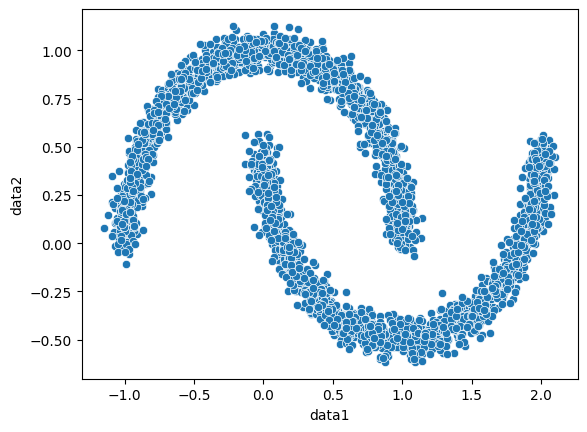

In [230]:
sns.scatterplot(x="data1", y="data2", data=df)
plt.show


In [231]:
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=0.2, min_samples=5)

In [239]:
dataset['label'] = dbscan.fit_predict(dataset)

In [242]:
dataset

,data1,data2,label
0,0.126781,-0.118781,0
1,-0.845127,0.588093,1
2,0.278071,-0.135424,0
3,0.845918,0.501296,1
4,1.489968,-0.363396,0
...,...,...,...
2995,0.077985,0.291760,0
2996,-0.641594,0.724232,1
2997,-0.758102,0.682769,1
2998,-0.848435,0.399415,1


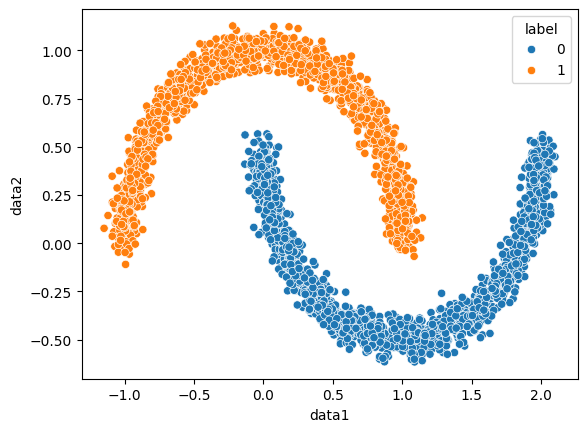

In [240]:
sns.scatterplot(x="data1", y="data2", hue="label", data=dataset)
plt.show()

## Silhouette Score :
is a measure of how similar an object is to its own cluster compared to other clusters. The silhouette score ranges from -1 to 1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

For example, a silhouette score of 0.5 indicates that the object is fairly close to its own cluster and far from neighboring clusters, while a score of -0.5 indicates that the object is likely misclassified.

Formula :
S = (b - a) / max(a, b)

Where:
- S is the silhouette score
- a is the average distance between a sample and all other points in the same cluster
- b is the average distance between a sample and all points in the next nearest cluster

Advantages:
- Used for evaluating the quality of clustering results.

In [244]:
dataset = pd.read_csv(r"/Users/adityagoyal/Downloads/Dataset/iris.csv")
dataset.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa


In [245]:
dataset.drop(columns=["species"], inplace=True)

In [246]:
from sklearn.cluster import KMeans

In [247]:
wcss = []
for i in range(1, 21):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(dataset)
    wcss.append(kmeans.inertia_)

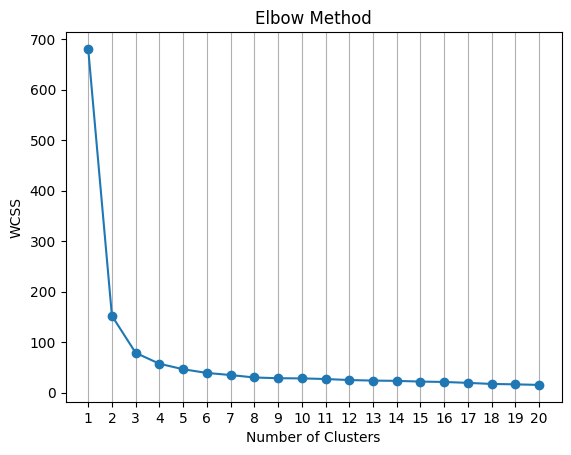

In [248]:
plt.plot([i for i in range(1, 21)], wcss, marker='o')
plt.title("Elbow Method")
plt.xlabel("Number of Clusters")
plt.xticks([i for i in range(1, 21)])
plt.ylabel("WCSS")
plt.grid(axis = 'x')
plt.show()

In [250]:
kmeans = KMeans(n_clusters=3, random_state=42)
dataset["predicted"] = kmeans.fit_predict(dataset)

In [251]:
kmeans.labels_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0,
       0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0,
       0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2], dtype=int32)

In [252]:
from sklearn.metrics import silhouette_score

In [253]:
silhouette_score(dataset, labels = kmeans.labels_)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b


0.6844657470953512

In [255]:
ss = []
number_of_clusters = [j for j in range(2, 21)]
for i in range(2, 21):
    km = KMeans(n_clusters=i, random_state=42)
    km.fit(dataset)
    score = silhouette_score(dataset, km.labels_)
    ss.append(score)


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: in

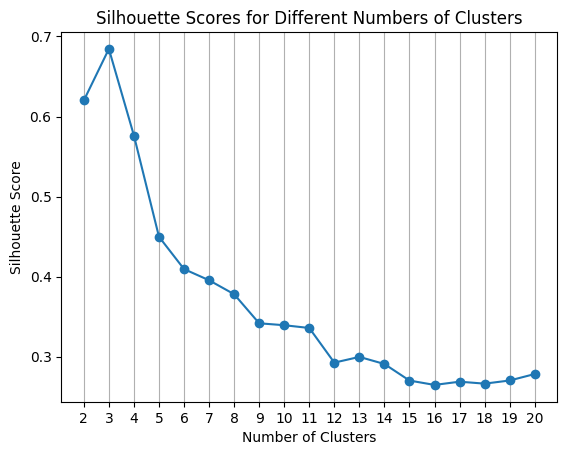

In [258]:
plt.plot(number_of_clusters, ss, marker='o')
plt.title("Silhouette Scores for Different Numbers of Clusters")
plt.xlabel("Number of Clusters")
plt.xticks(number_of_clusters)
plt.ylabel("Silhouette Score")
plt.grid(axis='x')
plt.show()

# Association Analysis :
Association analysis aims to find patterns or associations between different items in large datasets. It is widely used in market basket analysis to identify products that are frequently purchased together.
### Techniques :
- Apriori Algorithm
- Eclat Algorithm
- FP-Growth Algorithm

### Implementation Steps :
Association analysis is typically used in the following way:
1. **Data Preprocessing**: Clean and prepare the data for analysis.
2. **Frequent Itemset Generation**: Identify sets of items that frequently co-occur in transactions.
3. **Association Rule Mining**: Generate rules that describe the relationships between items.

### Advantages of Association Analysis :
- **Market Basket Analysis**: Helps retailers understand purchase behavior.
- **Recommendation Systems**: Improves product recommendations.
- **Fraud Detection**: Identifies unusual patterns that may indicate fraud.

#### Limitations of Association Analysis :
- **Data Sparsity**: Requires large datasets for meaningful patterns.
- **Interpretability**: Complex rules can be hard to interpret.
- **Dynamic Data**: Needs frequent updates to remain relevant.
 

### Support and Confidence
- **Support**: The proportion of transactions that contain a particular itemset. It helps identify the most frequently occurring itemsets.

- **Confidence**: The likelihood that a rule is true. It measures how often items in the consequent of a rule appear in transactions that contain the antecedent.

- **Lift**: The ratio of the observed support to that expected if X and Y were independent. It helps identify the strength of a rule over the randomness.

1. Formula for Support:
- \[ \text{Support}(X) = \frac{\text{Number of transactions containing } X}{\text{Total number of transactions}} \]

2. Formula for Confidence:
- \[ \text{Confidence}(X \rightarrow Y) = \frac{\text{Support}(X \cup Y)}{\text{Support}(X)} \]

3. Formula for Lift:
- \[ \text{Lift}(X \rightarrow Y) = \frac{\text{Support}(X \cup Y)}{\text{Support}(X) \times \text{Support}(Y)} \]


In [265]:
dataset = pd.read_csv(r"/Users/adityagoyal/Downloads/Dataset/groceries - groceries.csv")
dataset.head()

,Item(s),Item 1,Item 2,Item 3,Item 4,Item 5,Item 6,Item 7,Item 8,Item 9,...,Item 23,Item 24,Item 25,Item 26,Item 27,Item 28,Item 29,Item 30,Item 31,Item 32
0,4,citrus fruit,semi-finished bread,margarine,ready soups,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3,tropical fruit,yogurt,coffee,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,whole milk,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,pip fruit,yogurt,cream cheese,meat spreads,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,other vegetables,whole milk,condensed milk,long life bakery product,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [266]:
dataset.columns

Index(['Item(s)', 'Item 1', 'Item 2', 'Item 3', 'Item 4', 'Item 5', 'Item 6',
       'Item 7', 'Item 8', 'Item 9', 'Item 10', 'Item 11', 'Item 12',
       'Item 13', 'Item 14', 'Item 15', 'Item 16', 'Item 17', 'Item 18',
       'Item 19', 'Item 20', 'Item 21', 'Item 22', 'Item 23', 'Item 24',
       'Item 25', 'Item 26', 'Item 27', 'Item 28', 'Item 29', 'Item 30',
       'Item 31', 'Item 32'],
      dtype='object')

In [268]:
dataset["Item 1"]

0              citrus fruit
1            tropical fruit
2                whole milk
3                 pip fruit
4          other vegetables
               ...         
9830                sausage
9831      cooking chocolate
9832                chicken
9833    semi-finished bread
9834                chicken
Name: Item 1, Length: 9835, dtype: object

In [269]:
dataset.shape

(9835, 33)

In [272]:
market = []
for i in range(0,dataset.shape[0]):
    cus = []
    for j in dataset.columns:
        if type(dataset[j][i]) == str:
            cus.append(dataset[j][i])
    market.append(cus)

In [273]:
import collections

In [275]:
market

[['citrus fruit', 'semi-finished bread', 'margarine', 'ready soups'],
 ['tropical fruit', 'yogurt', 'coffee'],
 ['whole milk'],
 ['pip fruit', 'yogurt', 'cream cheese', 'meat spreads'],
 ['other vegetables',
  'whole milk',
  'condensed milk',
  'long life bakery product'],
 ['whole milk', 'butter', 'yogurt', 'rice', 'abrasive cleaner'],
 ['rolls/buns'],
 ['other vegetables',
  'UHT-milk',
  'rolls/buns',
  'bottled beer',
  'liquor (appetizer)'],
 ['potted plants'],
 ['whole milk', 'cereals'],
 ['tropical fruit',
  'other vegetables',
  'white bread',
  'bottled water',
  'chocolate'],
 ['citrus fruit',
  'tropical fruit',
  'whole milk',
  'butter',
  'curd',
  'yogurt',
  'flour',
  'bottled water',
  'dishes'],
 ['beef'],
 ['frankfurter', 'rolls/buns', 'soda'],
 ['chicken', 'tropical fruit'],
 ['butter', 'sugar', 'fruit/vegetable juice', 'newspapers'],
 ['fruit/vegetable juice'],
 ['packaged fruit/vegetables'],
 ['chocolate'],
 ['specialty bar'],
 ['other vegetables'],
 ['butter mi

In [279]:
l = []
for i in market:
    for j in i:
        l.append(j)
p = collections.Counter(l)

In [280]:
p

Counter({'whole milk': 2513,
         'other vegetables': 1903,
         'rolls/buns': 1809,
         'soda': 1715,
         'yogurt': 1372,
         'bottled water': 1087,
         'root vegetables': 1072,
         'tropical fruit': 1032,
         'shopping bags': 969,
         'sausage': 924,
         'pastry': 875,
         'citrus fruit': 814,
         'bottled beer': 792,
         'newspapers': 785,
         'canned beer': 764,
         'pip fruit': 744,
         'fruit/vegetable juice': 711,
         'whipped/sour cream': 705,
         'brown bread': 638,
         'domestic eggs': 624,
         'frankfurter': 580,
         'margarine': 576,
         'coffee': 571,
         'pork': 567,
         'butter': 545,
         'curd': 524,
         'beef': 516,
         'napkins': 515,
         'chocolate': 488,
         'frozen vegetables': 473,
         'chicken': 422,
         'white bread': 414,
         'cream cheese': 390,
         'waffles': 378,
         'salty snack': 372,
      

In [281]:
collections.Counter(l)

Counter({'whole milk': 2513,
         'other vegetables': 1903,
         'rolls/buns': 1809,
         'soda': 1715,
         'yogurt': 1372,
         'bottled water': 1087,
         'root vegetables': 1072,
         'tropical fruit': 1032,
         'shopping bags': 969,
         'sausage': 924,
         'pastry': 875,
         'citrus fruit': 814,
         'bottled beer': 792,
         'newspapers': 785,
         'canned beer': 764,
         'pip fruit': 744,
         'fruit/vegetable juice': 711,
         'whipped/sour cream': 705,
         'brown bread': 638,
         'domestic eggs': 624,
         'frankfurter': 580,
         'margarine': 576,
         'coffee': 571,
         'pork': 567,
         'butter': 545,
         'curd': 524,
         'beef': 516,
         'napkins': 515,
         'chocolate': 488,
         'frozen vegetables': 473,
         'chicken': 422,
         'white bread': 414,
         'cream cheese': 390,
         'waffles': 378,
         'salty snack': 372,
      

In [282]:
d = {"Item Name":p.keys(), "value":p.values()}

In [284]:
pd.set_option('display.max_rows', 200)

In [285]:
pd.DataFrame(d).sort_values(by="value", ascending=False)

,Item Name,value
7,whole milk,2513
11,other vegetables,1903
17,rolls/buns,1809
31,soda,1715
5,yogurt,1372
24,bottled water,1087
42,root vegetables,1072
4,tropical fruit,1032
52,shopping bags,969
50,sausage,924


# Apriori Algorithm :
is a classic algorithm used in data mining for learning association rules. It is particularly useful for market basket analysis, where the goal is to find sets of products that frequently co-occur in transactions.

In [286]:
from mlxtend.preprocessing.transactionencoder import TransactionEncoder  
tr = TransactionEncoder()

In [287]:
tr.fit(market)

TransactionEncoder()

In [289]:
df = pd.DataFrame(tr.transform(market), columns=tr.columns_)

In [290]:
df

,Instant food products,UHT-milk,abrasive cleaner,artif. sweetener,baby cosmetics,baby food,bags,baking powder,bathroom cleaner,beef,...,turkey,vinegar,waffles,whipped/sour cream,whisky,white bread,white wine,whole milk,yogurt,zwieback
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9830,False,False,False,False,False,False,False,False,False,True,...,False,False,False,True,False,False,False,True,False,False
9831,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9832,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
9833,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [291]:
from mlxtend.frequent_patterns import apriori

In [296]:
apriori(df, min_support=0.05, use_colnames=True, max_len=2).sort_values(by="support", ascending=False)

,support,itemsets
26,0.255516,(whole milk)
15,0.193493,(other vegetables)
19,0.183935,(rolls/buns)
23,0.174377,(soda)
27,0.139502,(yogurt)
2,0.110524,(bottled water)
20,0.108998,(root vegetables)
24,0.104931,(tropical fruit)
22,0.098526,(shopping bags)
21,0.093950,(sausage)


# Frequent Itemset Mining :
is a technique used in data mining to discover interesting patterns, associations, or relationships among a set of items in transactional data. It is commonly used in market basket analysis to identify products that are frequently purchased together.

In [297]:
market

[['citrus fruit', 'semi-finished bread', 'margarine', 'ready soups'],
 ['tropical fruit', 'yogurt', 'coffee'],
 ['whole milk'],
 ['pip fruit', 'yogurt', 'cream cheese', 'meat spreads'],
 ['other vegetables',
  'whole milk',
  'condensed milk',
  'long life bakery product'],
 ['whole milk', 'butter', 'yogurt', 'rice', 'abrasive cleaner'],
 ['rolls/buns'],
 ['other vegetables',
  'UHT-milk',
  'rolls/buns',
  'bottled beer',
  'liquor (appetizer)'],
 ['potted plants'],
 ['whole milk', 'cereals'],
 ['tropical fruit',
  'other vegetables',
  'white bread',
  'bottled water',
  'chocolate'],
 ['citrus fruit',
  'tropical fruit',
  'whole milk',
  'butter',
  'curd',
  'yogurt',
  'flour',
  'bottled water',
  'dishes'],
 ['beef'],
 ['frankfurter', 'rolls/buns', 'soda'],
 ['chicken', 'tropical fruit'],
 ['butter', 'sugar', 'fruit/vegetable juice', 'newspapers'],
 ['fruit/vegetable juice'],
 ['packaged fruit/vegetables'],
 ['chocolate'],
 ['specialty bar'],
 ['other vegetables'],
 ['butter mi

In [298]:
df

,Instant food products,UHT-milk,abrasive cleaner,artif. sweetener,baby cosmetics,baby food,bags,baking powder,bathroom cleaner,beef,...,turkey,vinegar,waffles,whipped/sour cream,whisky,white bread,white wine,whole milk,yogurt,zwieback
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9830,False,False,False,False,False,False,False,False,False,True,...,False,False,False,True,False,False,False,True,False,False
9831,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9832,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
9833,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [299]:
from mlxtend.frequent_patterns import apriori, association_rules , fpgrowth

In [ ]:
fpgrowth(df, min_support=0.05, use_colnames=True).sort_values(by="support", ascending=False)

,support,itemsets
5,0.255516,(whole milk)
7,0.193493,(other vegetables)
9,0.183935,(rolls/buns)
14,0.174377,(soda)
2,0.139502,(yogurt)
11,0.110524,(bottled water)
19,0.108998,(root vegetables)
3,0.104931,(tropical fruit)
22,0.098526,(shopping bags)
21,0.093950,(sausage)


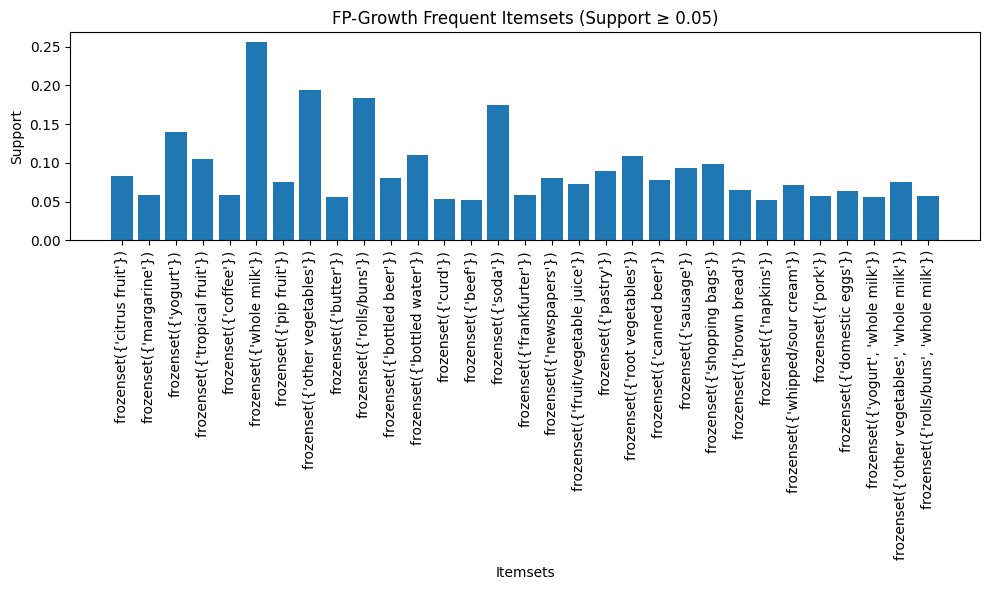

In [304]:
fp_supports = fpgrowth(df, min_support=0.05, use_colnames=True)
plt.figure(figsize=(10,6))
plt.bar(fp_supports['itemsets'].astype(str), fp_supports['support'])
plt.xticks(rotation=90)
plt.xlabel('Itemsets')
plt.ylabel('Support')
plt.title('FP-Growth Frequent Itemsets (Support ≥ 0.05)')
plt.tight_layout()
plt.show()